# Fin Whale call denoising attemp       

In [1]:
# Imports
import os
import gc
import glob
import h5py
import numpy as np
from tqdm import tqdm
import das4whales as d4w
import matplotlib.pyplot as plt
import scipy.signal as sp

In [2]:
# Download the data
url = 'http://piweb.ooirsn.uw.edu/das/data/Optasense/NorthCable/TransmitFiber/' \
        'North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-03T15_06_51-0700/'\
        'North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-04T020002Z.h5'

filepath, filename = d4w.data_handle.dl_file(url)
metadata = d4w.data_handle.get_acquisition_parameters(filepath, interrogator='optasense')
print(metadata)

North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-04T020002Z.h5 already stored locally
{'fs': 200.0, 'dx': 2.0419047, 'ns': 12000, 'n': 1.4682, 'GL': 51.04762, 'nx': 32600, 'scale_factor': 2.023019603699742e-13}


In [3]:
# Slice the matrix in arrays of 1500 time samples per 7500 spatial samples
# and save them in a new file

n_samples = 1500
n_spatial = 7500

with h5py.File(filepath, 'r') as f:
    data = f['Acquisition']['Raw[0]']['RawData']
    # print(data.shape)
    # Number of slices along the spatial axis
    n_slices0 = data.shape[0] // n_spatial
    # Number of slices along the time axis
    n_slices1 = data.shape[1] // n_samples
    gc.collect()
print(f'The data will be sliced in {n_slices0} files spatially and {n_slices1} files temporally')

all_calls = np.zeros((n_slices0 * n_slices1, n_spatial, n_samples), dtype=np.float32)

# Create a bandpass filter
b, a = sp.butter(8, [14, 30], btype='bandpass', fs=metadata['fs'])

for i in tqdm(range(n_slices0 * n_slices1), desc=f'Slicing {filename} in {n_slices0 * n_slices1} files'):
    with h5py.File(filepath, 'r') as f:
        data = f['Acquisition']['Raw[0]']['RawData']
        all_calls[i] = data[i // n_slices1 * n_spatial:(i // n_slices1 + 1) * n_spatial,
                          i % n_slices1 * n_samples:(i % n_slices1 + 1) * n_samples]
        # Apply the bandpass filter
        all_calls[i] = sp.filtfilt(b, a, all_calls[i], axis=1)
        
        # Normalize the data
        all_calls[i] = (all_calls[i] - np.mean(all_calls[i], axis=1, keepdims=True)) / np.std(all_calls[i], axis=1, keepdims=True)
   


The data will be sliced in 4 files spatially and 8 files temporally


Slicing North-C1-LR-P1kHz-GL50m-Sp2m-FS200Hz_2021-11-04T020002Z.h5 in 32 files: 100%|██████████| 32/32 [00:10<00:00,  3.05it/s]


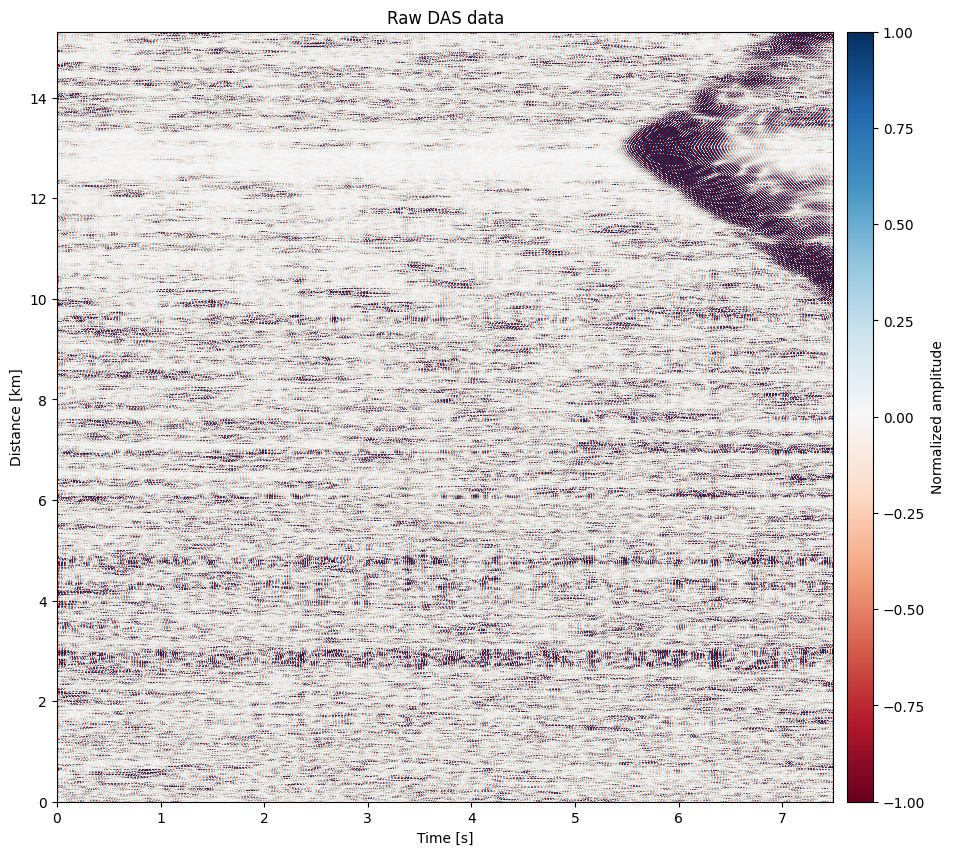

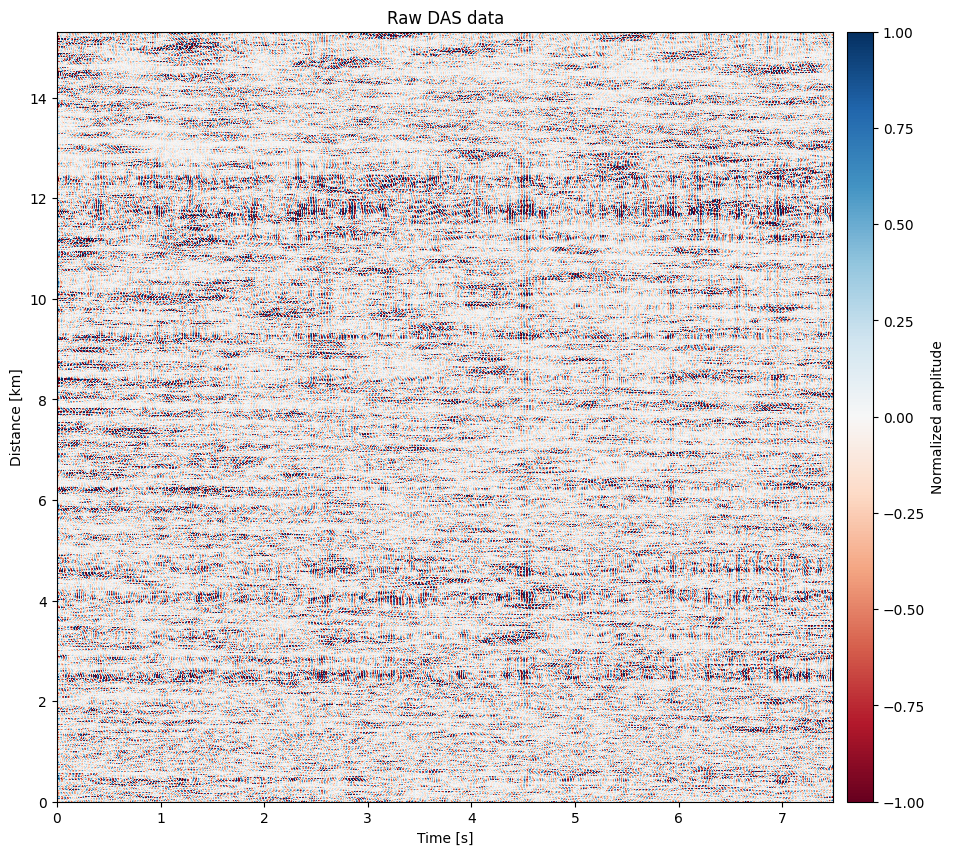

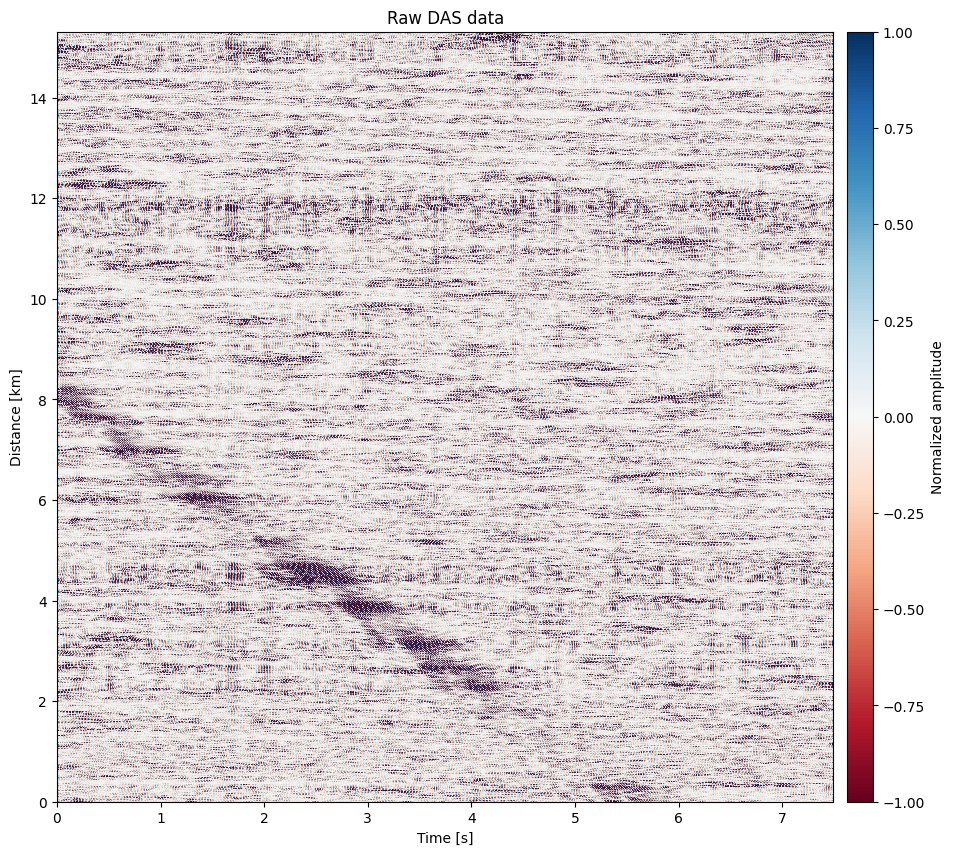

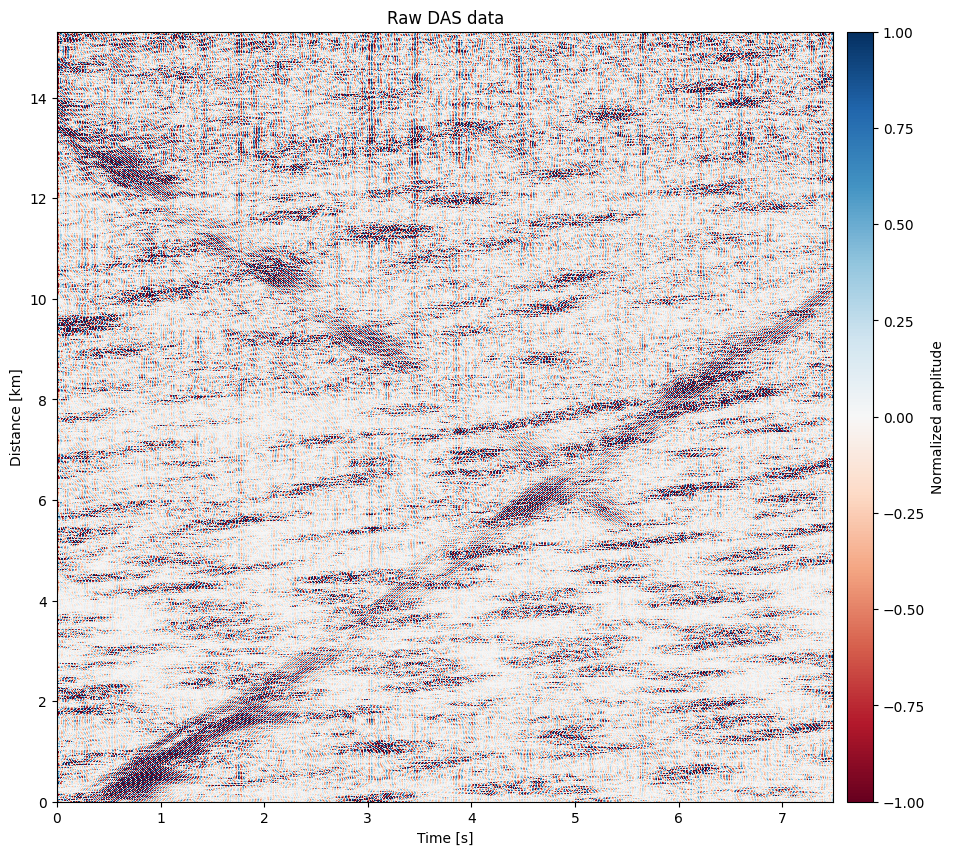

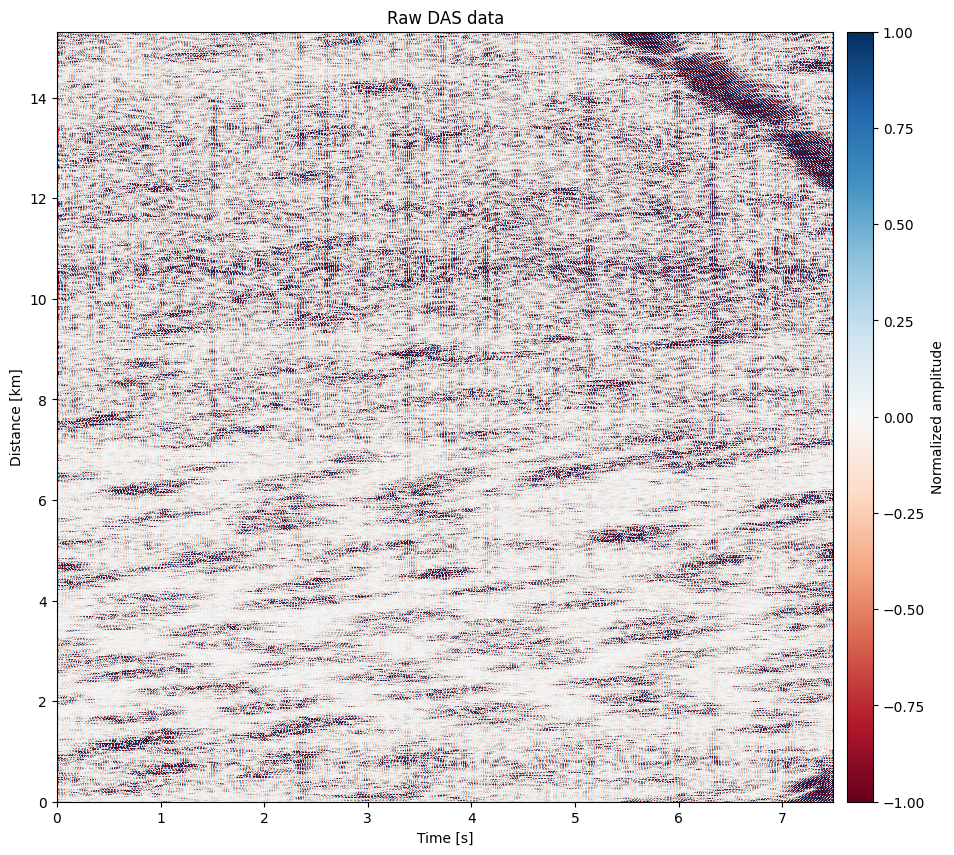

In [7]:
# Plot the first 10 slices
time = np.arange(n_samples) / metadata['fs']
dist = np.arange(n_spatial) * metadata['dx']
for i in range(11,20,2):
    fig = plt.figure(figsize=(12,10))
    wv = plt.imshow(all_calls[i], aspect='auto', cmap='RdBu', extent=[min(time),max(time),min(dist)*1e-3,max(dist)*1e-3], origin='lower', vmin=-1, vmax=1)
    plt.title('Raw DAS data')
    plt.ylabel('Distance [km]')
    plt.xlabel('Time [s]')
    bar = fig.colorbar(wv, aspect=30, pad=0.015)
    bar.set_label(label='Normalized amplitude')
    plt.show()

In [5]:
# Save the data
output_folder = 'sliced_data'
os.makedirs(output_folder, exist_ok=True)
print(all_calls.shape)
with h5py.File(f'{output_folder}/{filename}_sliced{n_slices0*n_slices1}.hdf5', 'w') as f:
    f.create_dataset('bandpassed_data', data=all_calls, dtype=np.float32)
    # Save the metadata as attributes
    for key in metadata:
        f.attrs[key] = metadata[key]

(32, 7500, 1500)
